## Context: 
McCurr Healthcare Consultancy is an MNC that has thousands of employees spread out across the globe. The company believes in hiring the best talent available and retaining them for as long as possible. A huge amount of resources is spent on retaining existing employees through various initiatives. The Head of People Operations wants to bring down the cost of retaining employees. For this, he proposes limiting the incentives to only those employees who are at risk of attrition. As a recently hired Data Scientist in the People Operations Department, you have been asked to identify patterns in characteristics of employees who leave the organization. Also, you have to use this information to predict if an employee is at risk of attrition. This information will be used to target them with incentives.

## Objective : 

* To identify the different factors that drive attrition
* To make a model to predict if an employee will attrite or not


## Dataset :

The data contains demographic details, work-related metrics and attrition flag.

* **EmployeeNumber** - Employee Identifier
* **Attrition** - Did the employee attrite?
* **Age** - Age of the employee
* **BusinessTravel** - Travel commitments for the job
* **DailyRate** - Data description not available**
* **Department** - Employee Department
* **DistanceFromHome** - Distance from work to home (in km)
* **Education** - 1-Below College, 2-College, 3-Bachelor, 4-Master,5-Doctor
* **EducationField** - Field of Education
* **EnvironmentSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
* **Gender** - Employee's gender
* **HourlyRate** - Data description not available**
* **JobInvolvement** - 1-Low, 2-Medium, 3-High, 4-Very High
* **JobLevel** - Level of job (1 to 5)
* **JobRole** - Job Roles
* **JobSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
* **MaritalStatus** - Marital Status
* **MonthlyIncome** - Monthly Salary
* **MonthlyRate** - Data description not available**
* **NumCompaniesWorked** - Number of companies worked at
* **Over18** - Over 18 years of age?
* **OverTime** - Overtime?
* **PercentSalaryHike** - The percentage increase in salary last year
* **PerformanceRating** - 1-Low, 2-Good, 3-Excellent, 4-Outstanding
* **RelationshipSatisfaction** - 1-Low, 2-Medium, 3-High, 4-Very High
* **StandardHours** - Standard Hours
* **StockOptionLevel** - Stock Option Level
* **TotalWorkingYears** - Total years worked
* **TrainingTimesLastYear** - Number of training attended last year
* **WorkLifeBalance** - 1-Low, 2-Good, 3-Excellent, 4-Outstanding
* **YearsAtCompany** - Years at Company
* **YearsInCurrentRole** - Years in the current role
* **YearsSinceLastPromotion** - Years since the last promotion
* **YearsWithCurrManager** - Years with the current manager

**In the real world, you will not find definitions for some of your variables. It is a part of the analysis to figure out what they might mean**

### Import the necessary libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

#to scale the data using z-score 
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

#algorithms to use
from sklearn.linear_model import LogisticRegression

#to build SVM model
from sklearn.svm import SVC

#Metrics to evaluate the model
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve,recall_score

#to build tree based models
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier


#for tuning the model
from sklearn.model_selection import GridSearchCV

#to ignore warnings
import warnings
warnings.filterwarnings("ignore")

### Read the dataset

In [12]:
#reading the dataset
df = pd.read_excel('HR_Employee_Attrition_Dataset.xlsx')

In [13]:
df.head()

,EmployeeNumber,Attrition,Age,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EnvironmentSatisfaction,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,1,Yes,41,Travel_Rarely,1102,Sales,1,2,Life Sciences,2,...,1,80,0,8,0,1,6,4,0,5
1,2,No,49,Travel_Frequently,279,Research & Development,8,1,Life Sciences,3,...,4,80,1,10,3,3,10,7,1,7
2,3,Yes,37,Travel_Rarely,1373,Research & Development,2,2,Other,4,...,2,80,0,7,3,3,0,0,0,0
3,4,No,33,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,4,...,3,80,0,8,3,3,8,7,3,0
4,5,No,27,Travel_Rarely,591,Research & Development,2,1,Medical,1,...,4,80,1,6,3,3,2,2,2,2


### Printing the information

In [14]:
df.duplicated().sum()
#No duplicated values found

0

In [15]:
df.info()
# No missing values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2940 entries, 0 to 2939
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   EmployeeNumber            2940 non-null   int64 
 1   Attrition                 2940 non-null   object
 2   Age                       2940 non-null   int64 
 3   BusinessTravel            2940 non-null   object
 4   DailyRate                 2940 non-null   int64 
 5   Department                2940 non-null   object
 6   DistanceFromHome          2940 non-null   int64 
 7   Education                 2940 non-null   int64 
 8   EducationField            2940 non-null   object
 9   EnvironmentSatisfaction   2940 non-null   int64 
 10  Gender                    2940 non-null   object
 11  HourlyRate                2940 non-null   int64 
 12  JobInvolvement            2940 non-null   int64 
 13  JobLevel                  2940 non-null   int64 
 14  JobRole                 

**Observations:**
- There are 2940 observations and 34 columns.
- All the column have 2940 non-null values i.e. there are no missing values in the data.

**Let's check the unique values in each column** 

In [16]:
#checking unique values in each column
df.nunique()

EmployeeNumber              2940
Attrition                      2
Age                           43
BusinessTravel                 3
DailyRate                    886
Department                     3
DistanceFromHome              29
Education                      5
EducationField                 6
EnvironmentSatisfaction        4
Gender                         2
HourlyRate                    71
JobInvolvement                 4
JobLevel                       5
JobRole                        9
JobSatisfaction                4
MaritalStatus                  3
MonthlyIncome               1349
MonthlyRate                 1427
NumCompaniesWorked            10
Over18                         1
OverTime                       2
PercentSalaryHike             15
PerformanceRating              2
RelationshipSatisfaction       4
StandardHours                  1
StockOptionLevel               4
TotalWorkingYears             40
TrainingTimesLastYear          7
WorkLifeBalance                4
YearsAtCom

**Observations:**
- Employee number is an identifier which is unique for each employee and we can drop this column as it would not add any value to our analysis.
- Over18 and StandardHours have only 1 unique value. These column will not add any value to our model hence we can drop them.
- On the basis of number of unique values in each column and the data description, we can identify the continuous and categorical columns in the data.

Let's drop the columns mentioned above and define lists for numerical and categorical columns to apply explore them separately.

In [17]:
#dropping the columns as dont add much to making predictions
df=df.drop(['EmployeeNumber','Over18','StandardHours'],axis=1)

In [18]:
#Creating numerical columns
num_cols=['DailyRate','Age','DistanceFromHome','MonthlyIncome','MonthlyRate','PercentSalaryHike','TotalWorkingYears',
          'YearsAtCompany','NumCompaniesWorked','HourlyRate',
          'YearsInCurrentRole','YearsSinceLastPromotion','YearsWithCurrManager','TrainingTimesLastYear']

#Creating categorical variables 
cat_cols= ['Attrition','OverTime','BusinessTravel', 'Department','Education', 'EducationField','JobSatisfaction','EnvironmentSatisfaction','WorkLifeBalance',
           'StockOptionLevel','Gender', 'PerformanceRating', 'JobInvolvement','JobLevel', 'JobRole', 'MaritalStatus','RelationshipSatisfaction']

### Let's start with univariate analysis of numerical columns

In [19]:
#Checking summary statistics
df[num_cols].describe().T

,count,mean,std,min,25%,50%,75%,max
DailyRate,2940.0,802.485714,403.440447,102.0,465.0,802.0,1157.0,1499.0
Age,2940.0,36.923810,9.133819,18.0,30.0,36.0,43.0,60.0
DistanceFromHome,2940.0,9.192517,8.105485,1.0,2.0,7.0,14.0,29.0
MonthlyIncome,2940.0,6502.931293,4707.155770,1009.0,2911.0,4919.0,8380.0,19999.0
MonthlyRate,2940.0,14313.103401,7116.575021,2094.0,8045.0,14235.5,20462.0,26999.0
PercentSalaryHike,2940.0,15.209524,3.659315,11.0,12.0,14.0,18.0,25.0
TotalWorkingYears,2940.0,11.279592,7.779458,0.0,6.0,10.0,15.0,40.0
YearsAtCompany,2940.0,7.008163,6.125483,0.0,3.0,5.0,9.0,40.0
NumCompaniesWorked,2940.0,2.693197,2.497584,0.0,1.0,2.0,4.0,9.0
HourlyRate,2940.0,65.891156,20.325969,30.0,48.0,66.0,84.0,100.0


**Observations:**
- **Average employee age is around 37 years**. It has a high range, from 18 years to 60, indicating good age diversity in the organization.
- **At least 50% of the employees live within a 7 km radius** from the organization. However there are some extreme values, seeing as the maximum value is 29 km.
- **The average monthly income of an employee is USD 6500.** It has a high range of values from 1K-20K USD, which is to be expected for any organization's income distribution. There is a big difference between the 3rd quartile value (around USD 8400) and the maximum value (nearly USD 20000), showing that the **company's highest earners have a disproportionately large income** in comparison to the rest of the employees. Again, this is fairly common in most organizations.
- **Average salary hike of an employee is around 15%.** At least 50% of employees got a salary hike 14% or less, with the maximum salary hike being 25%.
- Average number of years an employee is associated with the company is 7. 
- **On average, the number of years since an employee got a promotion is 2.18**. The majority of employees have been promoted since the last year.

Let's explore these variables in some more depth by observing their distributions

DailyRate
Skew : -0.0
Kurt : -1.2


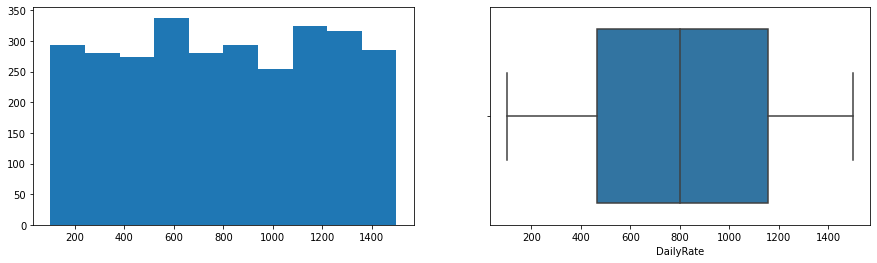

Age
Skew : 0.41
Kurt : -0.41


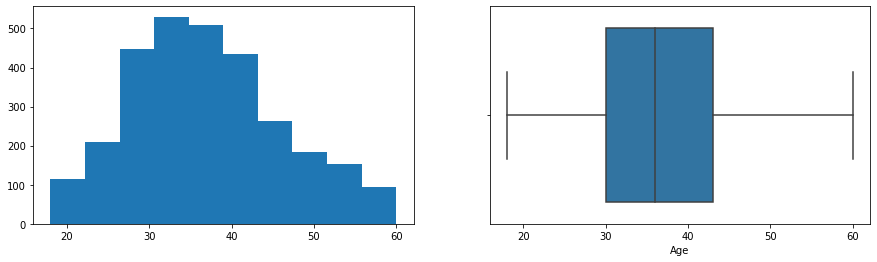

DistanceFromHome
Skew : 0.96
Kurt : -0.23


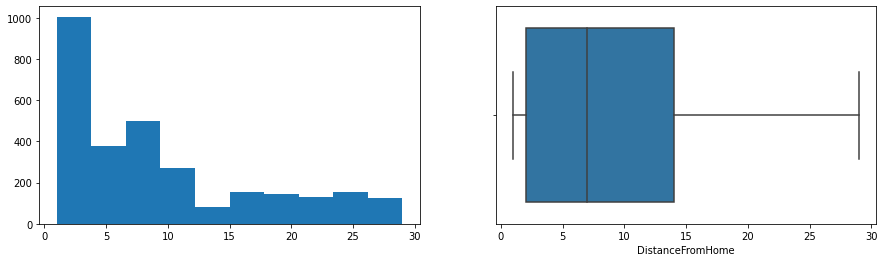

MonthlyIncome
Skew : 1.37
Kurt : 1.0


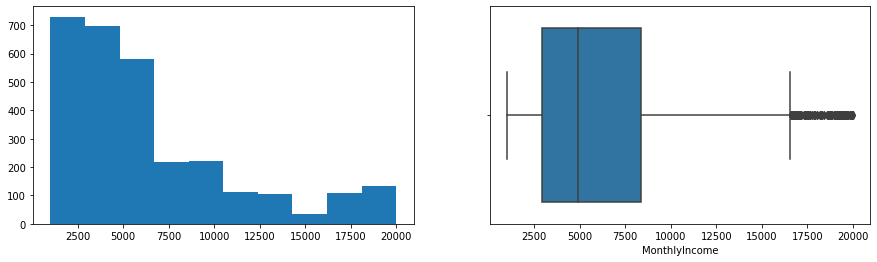

MonthlyRate
Skew : 0.02
Kurt : -1.21


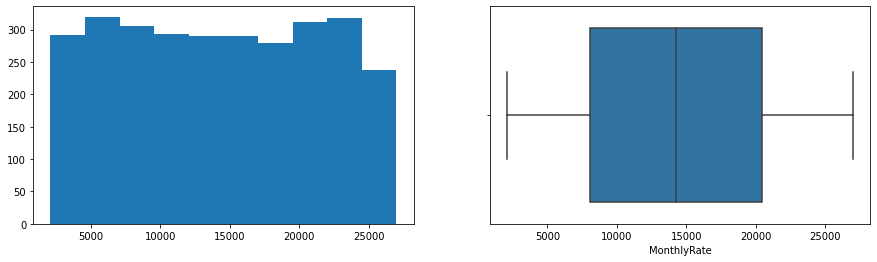

PercentSalaryHike
Skew : 0.82
Kurt : -0.3


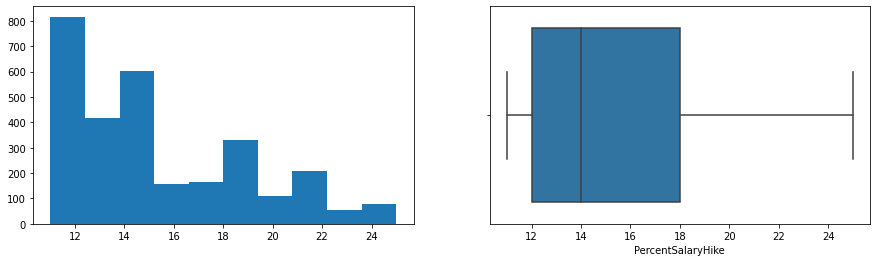

TotalWorkingYears
Skew : 1.12
Kurt : 0.91


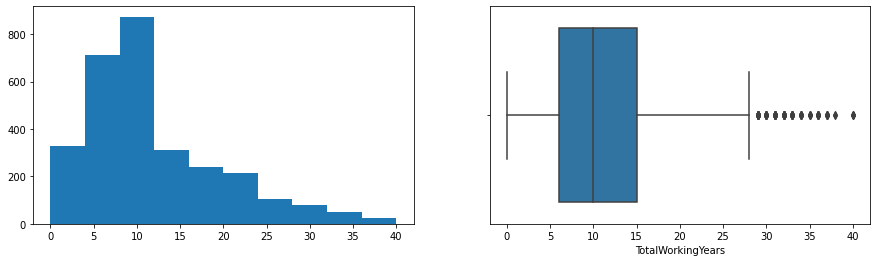

YearsAtCompany
Skew : 1.76
Kurt : 3.93


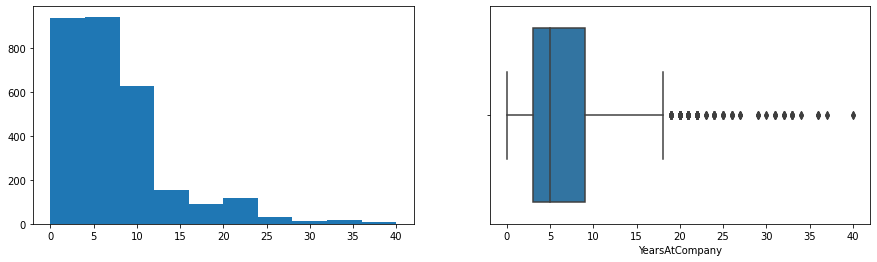

NumCompaniesWorked
Skew : 1.03
Kurt : 0.01


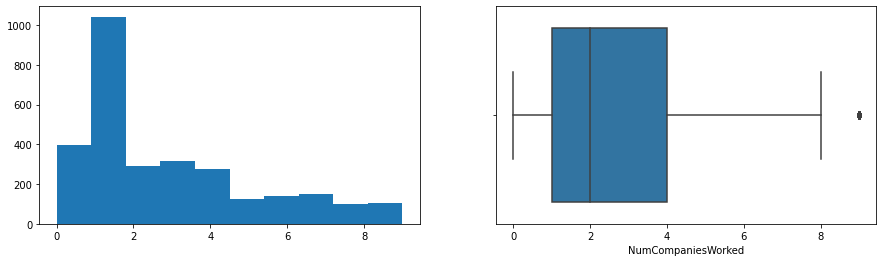

HourlyRate
Skew : -0.03
Kurt : -1.2


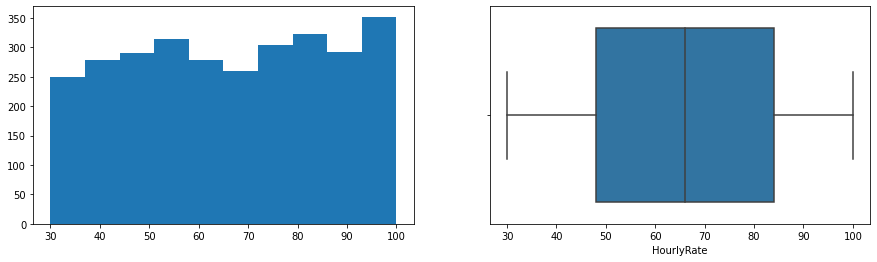

YearsInCurrentRole
Skew : 0.92
Kurt : 0.47


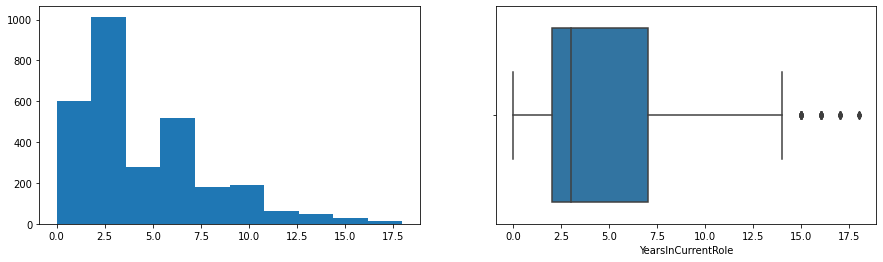

YearsSinceLastPromotion
Skew : 1.98
Kurt : 3.6


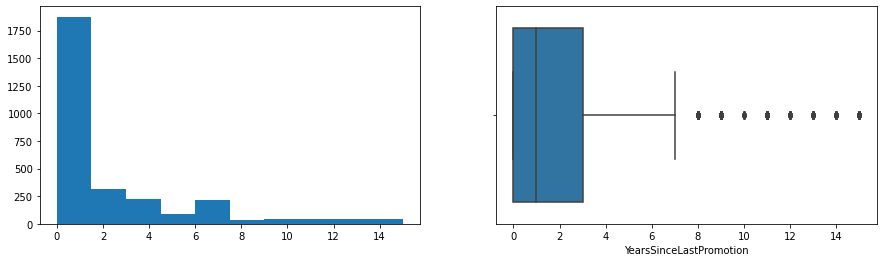

YearsWithCurrManager
Skew : 0.83
Kurt : 0.17


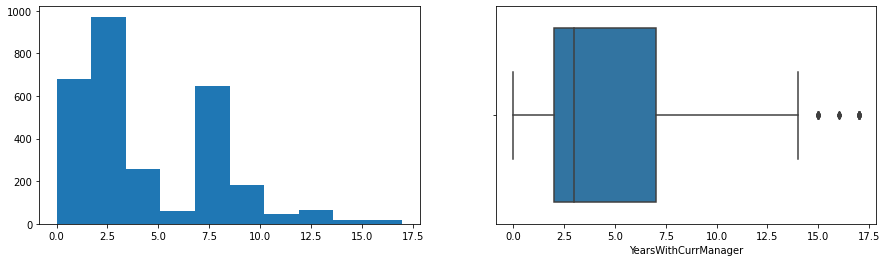

TrainingTimesLastYear
Skew : 0.55
Kurt : 0.49


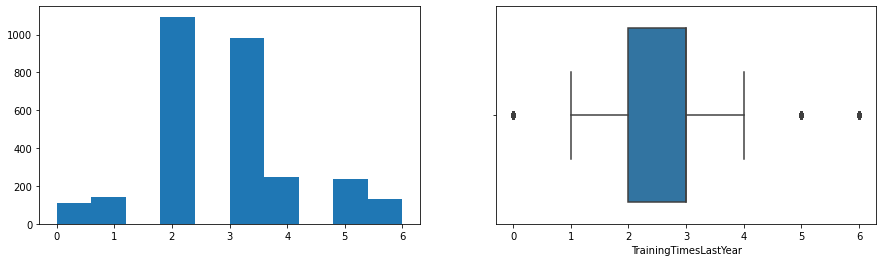

In [21]:
#creating histograms
for i in num_cols:
    print(i)
    print('Skew :',round(df[i].skew(),2))
    print('Kurt :',round(df[i].kurt(),2))
    plt.figure(figsize=(15,4))
    plt.subplot(1,2,1)
    df[i].hist(bins=10, grid=False)
    plt.subplot(1,2,2)
    sns.boxplot(x=df[i])
    plt.show()
#Columns that are not normal can be converted to normal dist using log transformation ex Monthly Income

**Observations:**

- **The age distribution is close to a normal distribution** with the majority of employees between the ages of 25 and 50.

- **The percentage salary hike is skewed to the right**, which means employees are mostly getting lower percentage salary increases.

- **MonthlyIncome and TotalWorkingYears are skewed to the right**, indicating that the majority of workers are in entry / mid-level positions in the organization.

- **DistanceFromHome also has a right skewed distribution**, meaning most employees live close to work but there are a few that live further away.

- **On average, an employee has worked at 2.5 companies.** Most employees have worked at only 1 company.

- **The YearsAtCompany variable distribution shows a good proportion of workers with 10+ years**, indicating a significant number of loyal employees at the organization. 

- **The YearsInCurrentRole distribution has three peaks at 0, 2, and 7.** There are a few employees that have even stayed in the same role for 15 years and more.

- **The YearsSinceLastPromotion variable distribution indicates that some employees have not received a promotion in 10-15 years and are still working in the organization.** These employees are assumed to be high work-experience employees in upper-management roles, such as co-founders, C-suite employees etc.

- The distributions of DailyRate, HourlyRate and MonthlyRate appear to be uniform and do not provide much information. It could be that daily rate refers to the income earned per extra day worked while hourly rate could refer to the same concept applied for extra hours worked per day. Since these rates tend to be broadly similar for multiple employees in the same department, that explains the uniform distribution they show. 

### Univariate analysis for categorical variables

In [22]:
#Printing the % sub categories of each category
for i in cat_cols:
    print(df[i].value_counts(normalize=True))
    print('*'*40)
#One feature engineering aspect here is combining categories that are very similar or if a category is very rare

No     0.838776
Yes    0.161224
Name: Attrition, dtype: float64
****************************************
No     0.717007
Yes    0.282993
Name: OverTime, dtype: float64
****************************************
Travel_Rarely        0.709524
Travel_Frequently    0.188435
Non-Travel           0.102041
Name: BusinessTravel, dtype: float64
****************************************
Research & Development    0.653741
Sales                     0.303401
Human Resources           0.042857
Name: Department, dtype: float64
****************************************
3    0.389116
4    0.270748
2    0.191837
1    0.115646
5    0.032653
Name: Education, dtype: float64
****************************************
Life Sciences       0.412245
Medical             0.315646
Marketing           0.108163
Technical Degree    0.089796
Other               0.055782
Human Resources     0.018367
Name: EducationField, dtype: float64
****************************************
4    0.312245
3    0.300680
1    0.196599
2    0.

**Observations:**

- **The employee attrition rate is 16%.**
- **Around 28% of the employees are working overtime.** This number appears to be on the higher side, and might indicate a stressed employee work-life.
- 71% of the employees have traveled rarely, while around 19% have to travel frequently.
- Around 73% of the employees come from an educational background in the Life Sciences and Medical fields. 
- Over 65% of employees work in the Research & Development department of the organization.
- **Nearly 40% of the employees have low (1) or medium-low (2) job satisfaction** and environment satisfaction in the organization, indicating that the morale of the company appears to be somewhat low.
- **Over 30% of the employees show low (1) to medium-low (2) job involvement.** 
- Over 80% of the employees either have none or very less stock options. 
- **In terms of performance ratings, none of the employees have rated lower than 3 (excellent).** About 85% of employees have a performance rating equal to 3 (excellent), while the remaining have a rating of 4 (outstanding). This could either mean that the majority of employees are top performers, or  the more likely scenario is that the organization could be highly lenient with its performance appraisal process.

### Bivariate and Multivariate analysis

**We have analyzed different categorical and numerical variables.** 

**Let's now check how does attrition rate is related with other categorical variables**

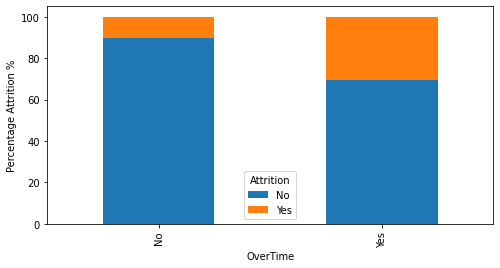

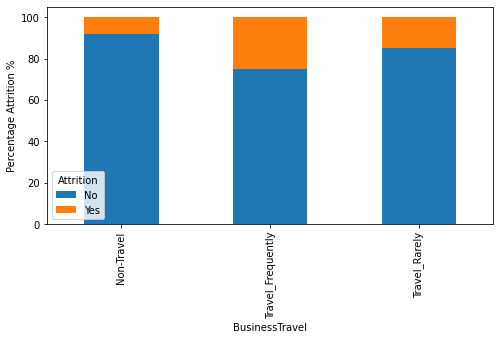

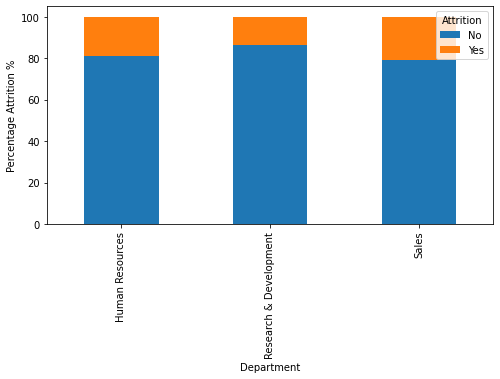

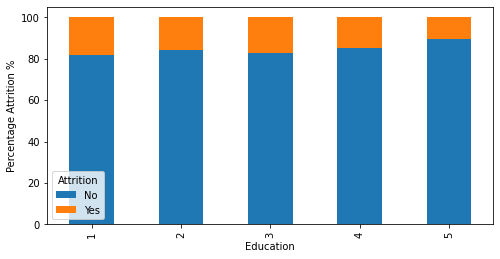

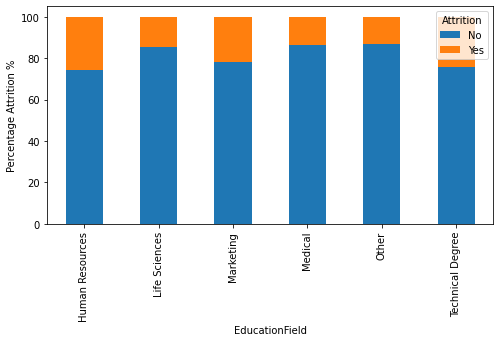

...

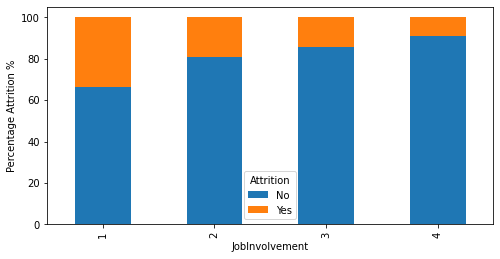

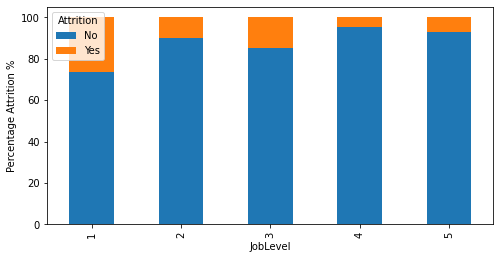

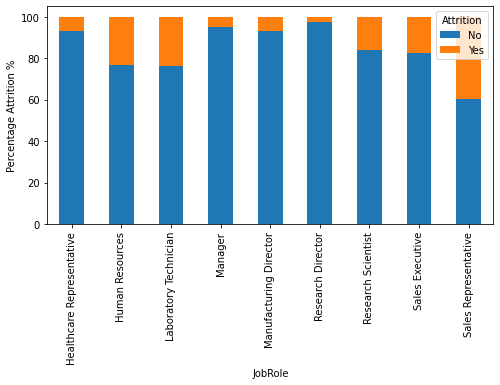

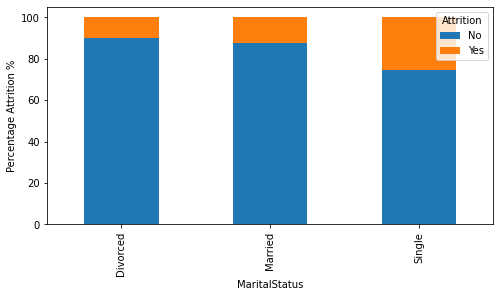

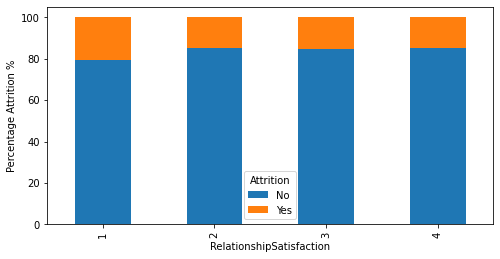

In [23]:
for i in cat_cols:
    if i!='Attrition':
        (pd.crosstab(df[i],df['Attrition'],normalize='index')*100).plot(kind='bar',figsize=(8,4),stacked=True)
        plt.ylabel('Percentage Attrition %')
#Most columns look interesting as we see variation in Attrition across categorical variables

**Observations:**
    
- **Employees working overtime have more than a 30% chance of attrition**, 
which is very high compared to the 10% chance of attrition for employees who do not work extra hours.
- As seen earlier, the majority of employees work for the R&D department. The chance of attrition there is ~15%
- **Employees working as sales representatives have an attrition rate of around 40%** while HRs and Technicians have an attrition rate of around 25%. The sales and HR departments have higher attrition rates in comparison to an academic department like Research & Development, an observation that makes intuitive sense keeping in mind the differences in those job profiles. The high-pressure and incentive-based nature of Sales and Marketing roles may be contributing to their higher attrition rates.
- **The lower the employee's job involvement, the higher their attrition chances appear to be, with 1-rated JobInvolvement employees attriting at 35%.** The reason for this could be that employees with lower job involvement might feel left out or less valued and have already started to explore new options, leading to a higher attrition rate.
- **Employees at a lower job level also attrite more,** with 1-rated JobLevel employees showing a nearly 25% chance of attrition. These may be young employees who tend to explore more options in the initial stages of their careers. 
- **A low work-life balance rating clearly leads employees to attrite**; 30% of those in the 1-rated category show attrition.

**Let's check the relationship between attrition and Numerical variables**

In [24]:
#Mean of numerical variables grouped by attrition
df.groupby(['Attrition'])[num_cols].mean()
# Similarly we see variation for attrition across numerical categories. 
# For percentsalaryhike is very close across attrition, we can use a Hypothesis Test (t test) to validate if the 
# difference is statistically significant

,DailyRate,Age,DistanceFromHome,MonthlyIncome,MonthlyRate,PercentSalaryHike,TotalWorkingYears,YearsAtCompany,NumCompaniesWorked,HourlyRate,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,TrainingTimesLastYear
Attrition,,,,,,,,,,,,,,
No,812.504461,37.561233,8.915653,6832.739659,14265.779400,15.231144,11.862936,7.369019,2.645580,65.952149,4.484185,2.234388,4.367397,2.832928
Yes,750.362869,33.607595,10.632911,4787.092827,14559.308017,15.097046,8.244726,5.130802,2.940928,65.573840,2.902954,1.945148,2.852321,2.624473


**Observations:**
- **Employees leaving the company have a nearly 30% lower average income and 30% lesser work experience than those who are not.** These could be the employees looking to explore new options and/or increase their salary with a company switch. 
- **Employees showing attrition also tend to live 16% further from the office than those who are not**. The longer commute to and from work could mean they have to spend more time/money every day, and this could be leading to job dissatisfaction and wanting to leave the organization.

**We have found out what kind of employees are leaving the company more.**

### Let's check the relationship between different numerical variables

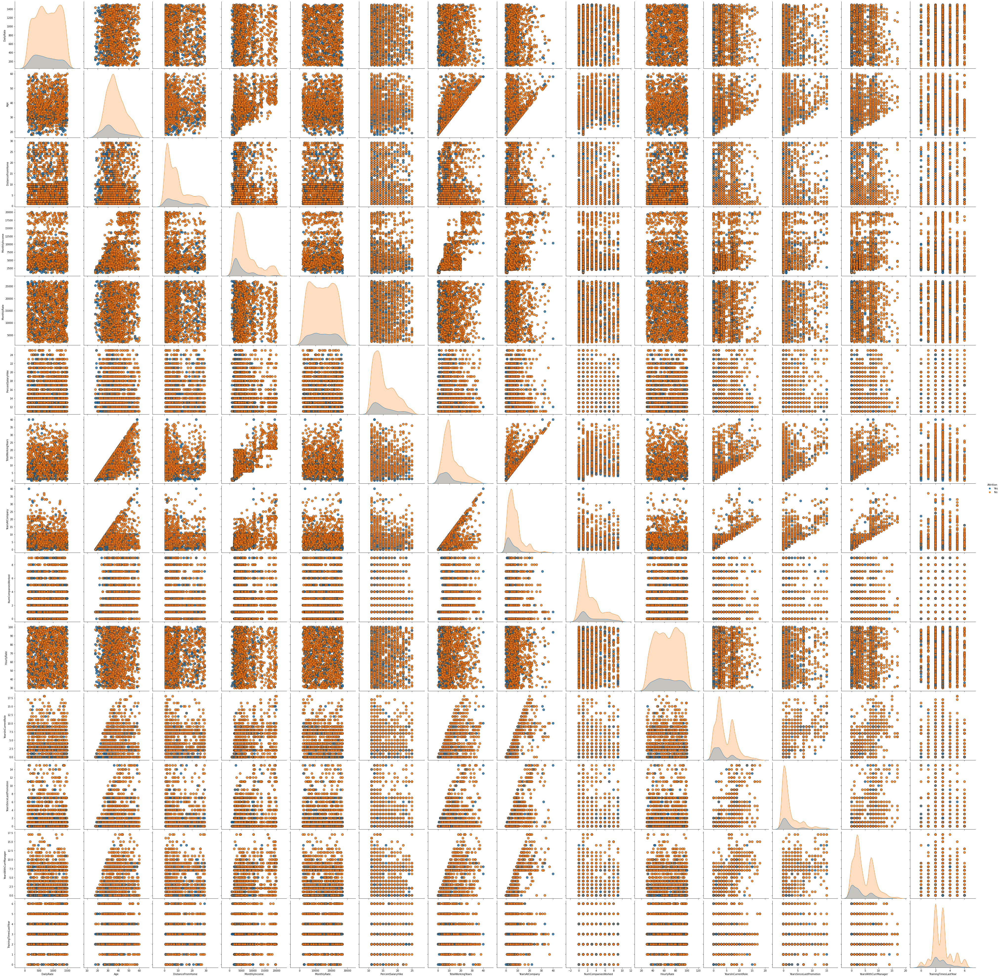

In [29]:
#pairplot with attrition as hue to get relationships
sns.pairplot(df, x_vars=num_cols, y_vars=num_cols
             ,hue="Attrition",diag_kind ='kde'
             ,plot_kws = {'alpha': 0.6, 's': 80, 'edgecolor': 'k'},size = 4)

<AxesSubplot:>

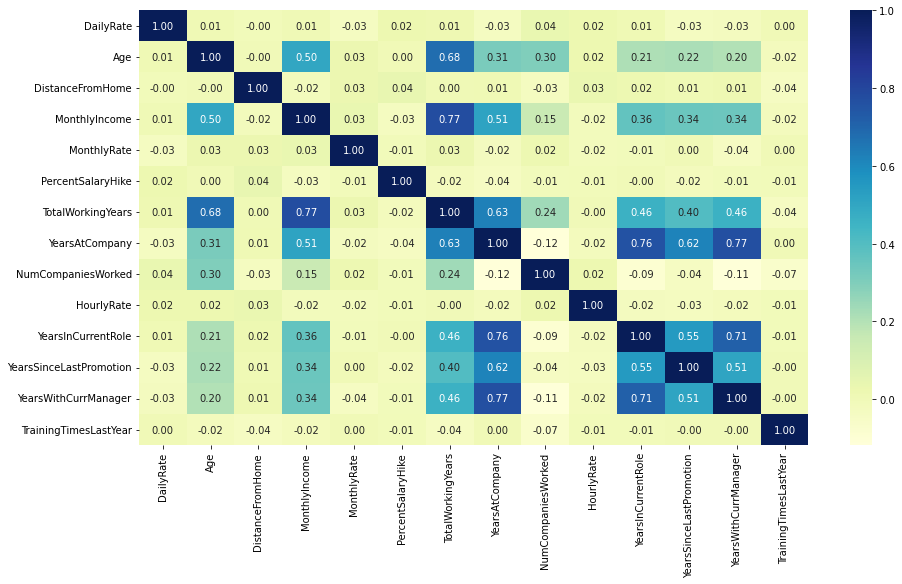

In [26]:
#plotting the correlation between numerical variables
plt.figure(figsize=(15,8))
sns.heatmap(df[num_cols + ['Attrition']].corr(),annot=True, fmt='0.2f', cmap='YlGnBu')
#For running Logistic regression or Linear models, you can remove correlated features using VIF

**Observations:**

- **Total work experience, monthly income, years at company and years with current manager are highly correlated with each other and with employee age** which is easy to understand as these variables show an increase with age for most employees. 
- Years at company and years in current role are correlated with years since last promotion which means that the company is not giving promotions at the right time.

**Now we have explored our data. Let's build the model**

## Model Building - Approach
1. Prepare data for modeling
2. Partition the data into train and test set.
3. Build model on the train data.
4. Tune the model if required.
5. Test the data on test set.

###  Preparing data for modeling

**Creating dummy variables for categorical Variables**

In [30]:
df2 = df.copy()

In [31]:
data=df.copy()

#creating list of dummy columns
to_get_dummies_for = ['BusinessTravel', 'Department','Education', 'EducationField','EnvironmentSatisfaction', 'Gender',  'JobInvolvement','JobLevel', 'JobRole', 'MaritalStatus' ]

#creating dummy variables
df = pd.get_dummies(data = df, columns= to_get_dummies_for, drop_first= True)      

#mapping overtime and attrition
dict_OverTime = {'Yes': 1, 'No':0}
dict_attrition = {'Yes': 1, 'No': 0}


df['OverTime'] = df.OverTime.map(dict_OverTime)
df['Attrition'] = df.Attrition.map(dict_attrition)

**Separating the independent variables (X) and the dependent variable (Y)**

In [32]:
#Separating target variable and other variables
Y= df.Attrition
X= df.drop(columns = ['Attrition'])

### Splitting the data into train, validation & test dataset

Some classification problems can exhibit a large imbalance in the distribution of the target classes: for instance there could be several times more negative samples than positive samples. In such cases it is recommended to use the **stratified sampling** technique to ensure that relative class frequencies are approximately preserved in each train and validation fold.

In [33]:
#splitting the data
X.shape

(2940, 54)

In [34]:
X_Train, X_test, Y_Train, y_test = train_test_split(X,Y, random_state = 1, stratify = Y,test_size=0.15,train_size=0.85)
X_train, x_cv, y_train, y_cv = train_test_split(X_Train,Y_Train,test_size = 0.15,train_size =0.85,random_state=1)

In [35]:
print(y_train.shape)
print(y_cv.shape)
print(y_test.shape)

(2124,)
(375,)
(441,)


In [36]:
print(X_train.shape)
print(x_cv.shape)
print(X_test.shape)

(2124, 54)
(375, 54)
(441, 54)


In [37]:
# Distribution of 0 & 1 is similar across train, test and crossvalidation
y_train.value_counts(normalize=True)

0    0.838041
1    0.161959
Name: Attrition, dtype: float64

In [38]:
y_cv.value_counts(normalize=True)

0    0.842667
1    0.157333
Name: Attrition, dtype: float64

In [39]:
y_test.value_counts(normalize=True)

0    0.839002
1    0.160998
Name: Attrition, dtype: float64

### Scaling the data

The independent variables in this dataset have different scales. When features have different scales from each other, there is a chance that a higher weightage will be given to features that have a higher magnitude, and they will dominate over other features whose magnitude changes may be smaller but whose percentage changes may be just as significant or even larger. This will impact the performance of our machine learning algorithm, and we do not want our algorithm to be biased towards one feature. 

The solution to this issue is **Feature Scaling**, i.e. scaling the dataset so as to give every transformed variable a comparable scale.

In this problem, we will use the **Standard Scaler** method, which centers and scales the dataset using the Z-Score.

It standardizes features by subtracting the mean and scaling it to have unit variance.

The standard score of a sample x is calculated as:

**z = (x - u) / s**

where **u** is the mean of the training samples (zero) and **s** is the standard deviation of the training samples.

In [40]:
#Scaling the data - after splitting to train, test and validation - avoid data leakage
sc=StandardScaler()
X_train_scaled=sc.fit_transform(X_train)
X_train_scaled=pd.DataFrame(X_train_scaled, columns=X.columns)

In [41]:
#Transform Validation & Test Dataset using training set standard scaler values
X_cv_scaled=sc.transform(x_cv)
X_cv_scaled=pd.DataFrame(X_cv_scaled, columns=X.columns)

In [42]:
X_test_scaled=sc.transform(X_test)
X_test_scaled=pd.DataFrame(X_test_scaled, columns=X.columns)

### Model evaluation criterion

#### The model can make two types of wrong predictions:
1. Predicting an employee will attrite when the employee doesn't attrite
2. Predicting an employee will not attrite and the employee actually attrites

#### Which case is more important? 
* **Predicting that the employee will not attrite but the employee attrites** i.e. losing out on a valuable employee or asset. This would be considered a major miss for any employee attrition predictor, and is hence the more important case of wrong predictions.

#### How to reduce this loss i.e the need to reduce False Negatives?
* **The company would want the Recall to be maximized**, the greater the Recall, the higher the chances of minimizing false negatives. Hence, the focus should be on increasing Recall (minimizing the false negatives) or in other words identifying the true positives (i.e. Class 1) very well, so that the company can provide incentives to control attrition rate especially for top-performers. This would help in optimizing the overall project cost towards retaining the best talent.

Also, let's create a function to calculate and print the classification report and confusion matrix so that we don't have to rewrite the same code repeatedly for each model.

In [43]:
#creating metric function with focus on recall for 1(Positive Class) as our objective evaluation metric
def metrics_score(actual, predicted):
    print(classification_report(actual, predicted))
    cm = confusion_matrix(actual, predicted)
    plt.figure(figsize=(8,5))
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels=['Not Attrite', 'Attrite'], yticklabels=['Not Attrite', 'Attrite'])
    plt.ylabel('Actual')
    plt.xlabel('Predicted')
    plt.show()

#### Building the model

We will be building 2 different models:
- **Logistic Regression**
- **Support Vector Machine(SVM)**

- The reported average includes the macro average which averages the unweighted mean per label, and the weighted average i.e. averaging the support-weighted mean per label.
- In classification, the class of interest is considered the positive class. Here, the class of interest is 1 i.e. identifying the employees at risk of attrition.

**Reading the confusion matrix (clockwise):**

* True Negative (Actual=0, Predicted=0): Model predicts that an employee would not attrite and the employee does not attrite 

* False Positive (Actual=0, Predicted=1): Model predicts that an employee would attrite but the employee does not attrite

* False Negative (Actual=1, Predicted=0): Model predicts that an employee would not attrite but the employee attrites

* True Positive (Actual=1, Predicted=1): Model predicts that an employee would attrite and the employee actually attrites

### Logistic Regression Model 

- Logistic Regression is a supervised learning algorithm which is used for **binary classification problems** i.e. where the dependent variable is categorical and has only two possible values. In logistic regression, we use the sigmoid function to calculate the probability of an event y, given some features x as:

                                          P(y)=1/exp(1 + exp(-x))

In [44]:
#fitting logistic regression model
lg=LogisticRegression()
lg.fit(X_train_scaled,y_train)

LogisticRegression()

**Checking model performance**

- The reported average includes the macro average which averages the unweighted mean per label, and the weighted average i.e. averaging the support-weighted mean per label.
- In classification, the class of interest is considered the positive class. Here, the class of interest is 1 i.e. identifying the employees at risk of attrition.

**Reading the confusion matrix (clockwise):**

* True Negative (Actual=0, Predicted=0): Model predicts that an employee would not attrite and the employee does not attrite 

* False Positive (Actual=0, Predicted=1): Model predicts that an employee would attrite but the employee does not attrite

* False Negative (Actual=1, Predicted=0): Model predicts that an employee would not attrite but the employee attrites

* True Positive (Actual=1, Predicted=1): Model predicts that an employee would attrite and the employee actually attrites

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      1780
           1       0.76      0.50      0.60       344

    accuracy                           0.89      2124
   macro avg       0.83      0.73      0.77      2124
weighted avg       0.88      0.89      0.88      2124



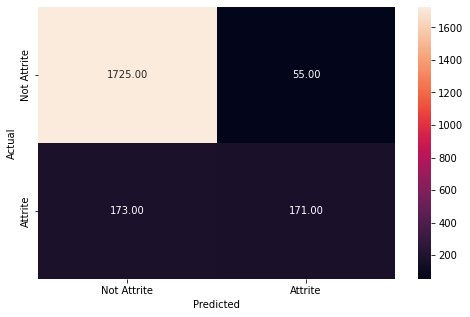

In [45]:
#checking the performance on the training data
y_pred_train = lg.predict(X_train_scaled)
metrics_score(y_train, y_pred_train)
#The model has poor recall so we can think of changing threshold to improve recall with a 
#tradeoff for precision

              precision    recall  f1-score   support

           0       0.91      0.97      0.94       316
           1       0.76      0.49      0.60        59

    accuracy                           0.90       375
   macro avg       0.84      0.73      0.77       375
weighted avg       0.89      0.90      0.89       375



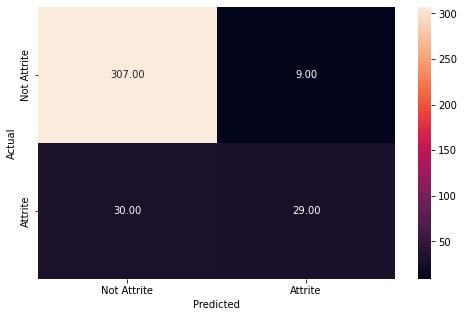

In [46]:
#checking the performance on the validation dataset
y_pred_cv = lg.predict(X_cv_scaled)
metrics_score(y_cv, y_pred_cv)

**Observations:**
- **We are getting an accuracy of around 90%** on train and test dataset.
- However, **the recall for this model is only around 50% for class 1 on train and 46% on test.**
- As the recall is low, **this model will not perform well** in differentiating out those employees who have a high chance of leaving the company, meaning it will eventually not help in reducing the attrition rate. 
- As we can see from the Confusion Matrix, **this model fails to identify the majority of employees who are at risk of attrition.**

**Let's check the coefficients and find which variables are leading to attrition and which can help to reduce the attrition**

In [47]:
#printing the coefficients of logistic regression
cols=X.columns

coef_lg=lg.coef_

pd.DataFrame(coef_lg,columns=cols).T.sort_values(by=0,ascending=False)

,0
JobRole_Sales Executive,0.948453
OverTime,0.927467
Department_Research & Development,0.762452
BusinessTravel_Travel_Frequently,0.653339
MaritalStatus_Single,0.647231
YearsSinceLastPromotion,0.528009
JobLevel_5,0.499658
NumCompaniesWorked,0.488787
JobRole_Sales Representative,0.456647
JobRole_Human Resources,0.432047


**Observations:**


**Features which positively affect on the attrition rate are:**
- OverTime	
- BusinessTravel_Travel_Frequently	
- Department_Research & Development	
- JobRole_Sales Executive	
- MaritalStatus_Single	
- Department_Sales	
- NumCompaniesWorked	
- YearsSinceLastPromotion
- JobLevel_5	
- BusinessTravel_Travel_Rarely
- DistanceFromHome
- YearsAtCompany	
- JobRole_Human Resources	
- JobRole_Sales Representative

**Features which negatively affect on the attrition rate are:**
- MonthlyIncome	
- JobInvolvement_3	
- JobLevel_2	
- EnvironmentSatisfaction_4	
- JobInvolvement_4	
- JobInvolvement_2	
- EnvironmentSatisfaction_3	
- EducationField_Life Sciences	
- EnvironmentSatisfaction_2	
- YearsWithCurrManager	
- JobRole_Research Director	
- TotalWorkingYears	
- JobSatisfaction	

**Observations:**

- Based on the Logistic Regression model, **Overtime is the most important feature** in detecting whether an employee would attrite or not.
- **This model also suggests that attrition is dependent on the employee's department.** Belonging to Sales or HR is shown to have a higher attrition rate which is understood, but the model also seems to suggest belonging to R&D contributes to a higher attrition rate, which is counter-intuitive. This could be because more than 65% of the employees are working in R&D, so the absolute number of employees who attrite from the company working in R&D will be significant even with a lower percentage. This is an example of the Simpson's paradox, and is evidence that a more powerful non-linear model may be necessary to accurately map the relationship between Department_Research & Development and the target variable. 
- **Business traveling is an important variable in predicting the attrition rate.** Employees who either travel a lot or travel rarely have high attrition rate. This could be because those who travel often might feel overworked and dissatisfied with their role, whereas employees traveling rarely (in an organization where nearly 90% of all employees are traveling) could be a sign of them feeling undervalued and disinterested and hence attriting more.
- **The number of companies the employee has worked for in the past also appears to impact the likelihood of attrition** - the greater the number the higher the chance the employee will attrite. This suggests that employees who have worked for a higher number of companies may probably not stay loyal and may continue switching companies.
- Other features which appear to affect the chances of attrition are the number of years at the current company and the distance from home, both with positive correlations to attrition likelihood.
- The Job Involvement features being negatively correlated with attrition signify that **employees who are more involved in their jobs tend to attrite less.** This could probably be because a high degree of job involvement might make employees feel they are more important to the company, and hence discourage them from attrition.
- The model also captures the **inverse relation between income and attrition** - suggesting attrition rates can be controlled by increasing employee salary.
-  **Employees who are satisfied with the environment and culture of the organization show a lower chance of attrition**, a conclusion that makes sense since a good work environment is likely to keep employees happy and prevent them from attriting.
- **Employees with higher total work experience and a good position in the organization are also less likely to attrite**, probably because working at the organization for several years and/or occupying a good position tends to promote job stability and discourages volatility.

The coefficients of the logistic regression model give us the log of odds, which is hard to interpret in the real world. We can convert the log of odds into real odds by taking its exponential.

In [48]:
odds = np.exp(lg.coef_[0]) #finding the odds

# adding the odds to a dataframe and sorting the values
pd.DataFrame(odds, X_train_scaled.columns, columns=['odds']).sort_values(by='odds', ascending=False) 

,odds
JobRole_Sales Executive,2.581712
OverTime,2.528097
Department_Research & Development,2.143526
BusinessTravel_Travel_Frequently,1.921947
MaritalStatus_Single,1.910245
YearsSinceLastPromotion,1.695553
JobLevel_5,1.648158
NumCompaniesWorked,1.630337
JobRole_Sales Representative,1.578772
JobRole_Human Resources,1.540407


**Observations**
- The odds of an employee working overtime to attrite are **2.6 times** the odds of one who is not, probably due to the fact that working overtime is not sustainable for an extended duration for any employee, and may lead to burnout and job dissatisfaction.
- The odds of an employee traveling frequently to attrite are **double** the odds of an employee who doesn't travel as often.
- The odds of single employees attriting are **1.8 times (80% higher than)** the odds of an employee with another marital status.

**Precision-Recall Curve for logistic regression**

**Precision-Recall curves summarize the trade-off between the true positive rate and the positive predictive value for a predictive model using different probability thresholds.**

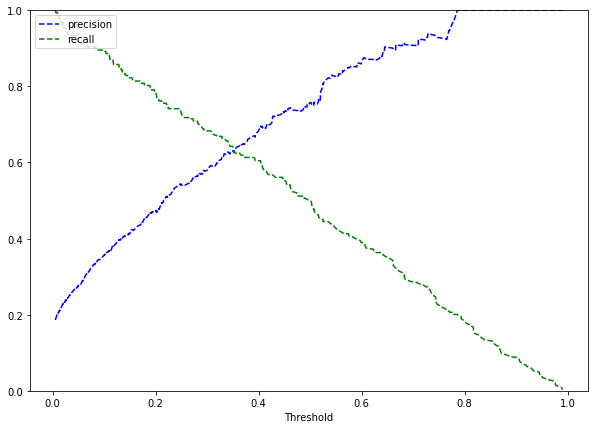

In [49]:
y_scores_lg=lg.predict_proba(X_train_scaled) #predict_proba gives the probability of each observation belonging to each class

precisions_lg, recalls_lg, thresholds_lg = precision_recall_curve(y_train, y_scores_lg[:,1])

#Plot values of precisions, recalls, and thresholds
plt.figure(figsize=(10,7))
plt.plot(thresholds_lg, precisions_lg[:-1], 'b--', label='precision')
plt.plot(thresholds_lg, recalls_lg[:-1], 'g--', label = 'recall')
plt.xlabel('Threshold')
plt.legend(loc='upper left')
plt.ylim([0,1])
plt.show()

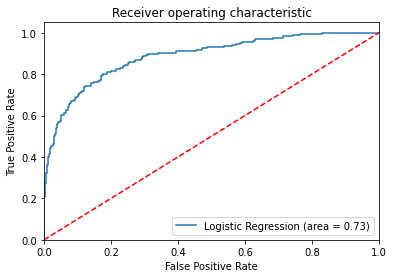

In [50]:
#AUC ROC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_train, lg.predict(X_train_scaled))
fpr, tpr, thresholds = roc_curve(y_train, lg.predict_proba(X_train_scaled)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()
#AUC can be used to compare across models.The logistic model has a AUC of 0.73

**Observation:**
- We can see that precision and recall are balanced for a threshold of about ~**0.35**.

**Let's find out the performance of the model at this threshold**

In [ ]:
optimal_threshold1=.35
y_pred_train = lg.predict_proba(X_train_scaled)
metrics_score(y_train, y_pred_train[:,1]>optimal_threshold1)

**Observations**
- **The model performance has improved. The recall has increased significantly for class 1.**
- Let's check the performance on the test data.

              precision    recall  f1-score   support

           0       0.93      0.92      0.93       316
           1       0.59      0.64      0.62        59

    accuracy                           0.87       375
   macro avg       0.76      0.78      0.77       375
weighted avg       0.88      0.87      0.88       375



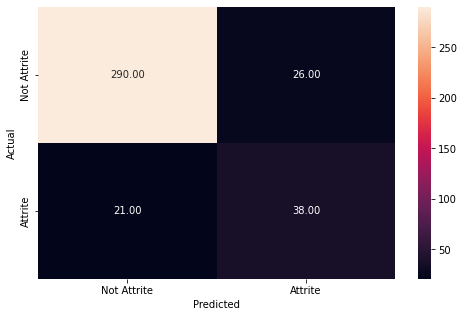

In [51]:
optimal_threshold1=.35
y_pred_test = lg.predict_proba(X_cv_scaled)
metrics_score(y_cv, y_pred_test[:,1]>optimal_threshold1)
#Recall improves as threshold is reduced with a tradeoff on precision side

**Observation:**
- The model is giving **similar performance on the test and train data** i.e. the model is giving a generalized performance.
- **The recall of the test data has increased significantly** while at the same time, the precision has decreased, which is to be expected while adjusting the threshold.
- The average recall and precision for the model are good but let's see if we can get better performance using other algorithms. 

In [57]:
#fitting SVM
svm = SVC(kernel = 'linear',probability=True) #linear kernal or linear decision boundary
model = svm.fit(X = X_train_scaled, y = y_train)

              precision    recall  f1-score   support

           0       0.91      0.98      0.94      1780
           1       0.80      0.48      0.60       344

    accuracy                           0.90      2124
   macro avg       0.85      0.73      0.77      2124
weighted avg       0.89      0.90      0.88      2124



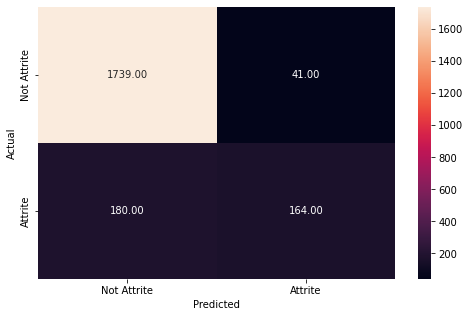

In [58]:
y_pred_train_svm = model.predict(X_train_scaled)
metrics_score(y_train, y_pred_train_svm)
#The model still doesnt do that well as recall is still low

              precision    recall  f1-score   support

           0       0.92      0.97      0.94       316
           1       0.74      0.53      0.61        59

    accuracy                           0.90       375
   macro avg       0.83      0.75      0.78       375
weighted avg       0.89      0.90      0.89       375



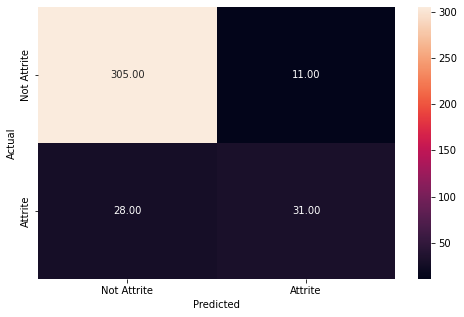

In [59]:
# Checking performance on the test data
y_pred_test_svm = model.predict(X_cv_scaled)
metrics_score(y_cv, y_pred_test_svm)

* SVM model with rbf linear is not overfitting as the accuracy is around 80% for both train and test dataset
* Recall for the model only around 50% which implies our model will not correctly predict the employees who are on the risk of attrite. 
* The precision is quite good and the model will help not five false positive and will save the cost and energy of the organization. 

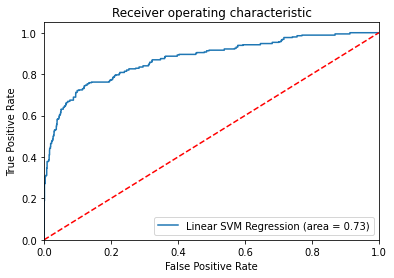

In [63]:
#AUC ROC curve
svm_linear_roc_auc = roc_auc_score(y_train, model.predict(X_train_scaled))
fpr, tpr, thresholds = roc_curve(y_train, model.predict_proba(X_train_scaled)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Linear SVM Regression (area = %0.2f)' % svm_linear_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()
#AUC is same as for logistic model of 0.73

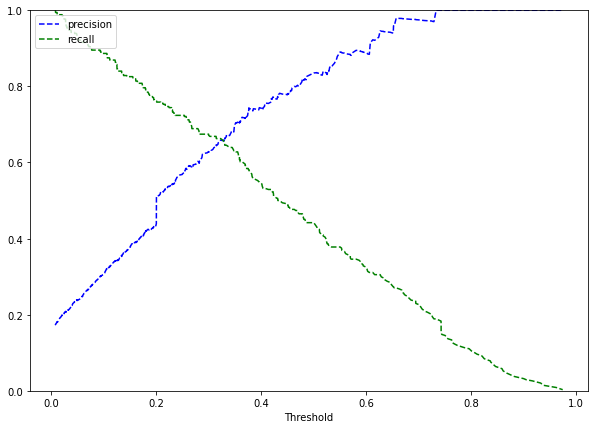

In [72]:
precisions_svm, recalls_svm, thresholds_svm = precision_recall_curve(y_train, model.predict_proba(X_train_scaled)[:,1])

#Plot values of precisions, recalls, and thresholds
plt.figure(figsize=(10,7))
plt.plot(thresholds_svm, precisions_svm[:-1], 'b--', label='precision')
plt.plot(thresholds_svm, recalls_svm[:-1], 'g--', label = 'recall')
plt.xlabel('Threshold')
plt.legend(loc='upper left')
plt.ylim([0,1])
plt.show()
#A good threshold could be 0.3 to improve model recall.

              precision    recall  f1-score   support

           0       0.93      0.95      0.94      1780
           1       0.70      0.63      0.66       344

    accuracy                           0.90      2124
   macro avg       0.81      0.79      0.80      2124
weighted avg       0.89      0.90      0.89      2124



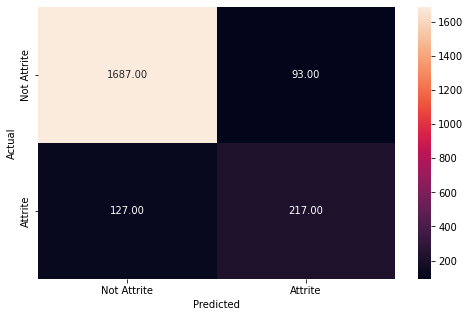

In [73]:
optimal_threshold1=.35
y_pred_train = model.predict_proba(X_train_scaled)
metrics_score(y_train, y_pred_train[:,1]>optimal_threshold1)
#The recall is slightly better when the threshold is reduced with minor trade off on precision

              precision    recall  f1-score   support

           0       0.94      0.89      0.91       316
           1       0.54      0.69      0.61        59

    accuracy                           0.86       375
   macro avg       0.74      0.79      0.76       375
weighted avg       0.88      0.86      0.87       375



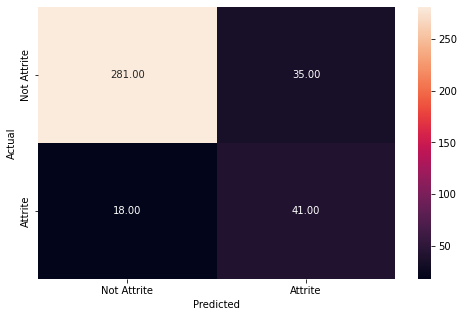

In [74]:
optimal_threshold1=.3
y_pred_test = model.predict_proba(X_cv_scaled)
metrics_score(y_cv, y_pred_test[:,1]>optimal_threshold1)

* At the optimal threshold of .35, the model performance has improved significantly. The recall has improved from 0.44 to .82 which is a ~40% increase and the model is giving good generalized results. 
* Moreover, the kernel used to create this is rbf, hence model is performing good with non-linear kernel.
* As the recall is high, **this model will perform well** in differentiating out those employees who have a high chance of leaving the company, meaning it will eventually help in reducing the attrition rate. 

In [67]:
#fitting SVM with non linear kernel function - radial basis function
svm = SVC(kernel = 'rbf',probability=True) #non linear kernal
model_rbf = svm.fit(X = X_train_scaled, y = y_train)

              precision    recall  f1-score   support

           0       0.95      1.00      0.97      1780
           1       0.99      0.73      0.84       344

    accuracy                           0.96      2124
   macro avg       0.97      0.87      0.91      2124
weighted avg       0.96      0.96      0.95      2124



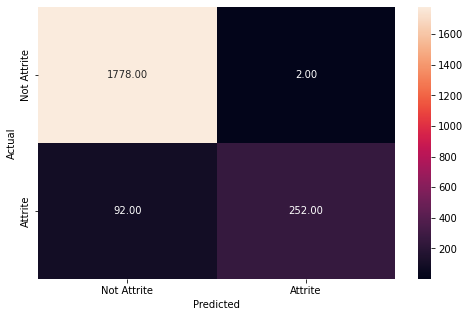

In [68]:
y_pred_train_svm = model_rbf.predict(X_train_scaled)
metrics_score(y_train, y_pred_train_svm)
#The model_rbf performs slightly better with higher recall

              precision    recall  f1-score   support

           0       0.92      1.00      0.96       316
           1       0.97      0.54      0.70        59

    accuracy                           0.93       375
   macro avg       0.95      0.77      0.83       375
weighted avg       0.93      0.93      0.92       375



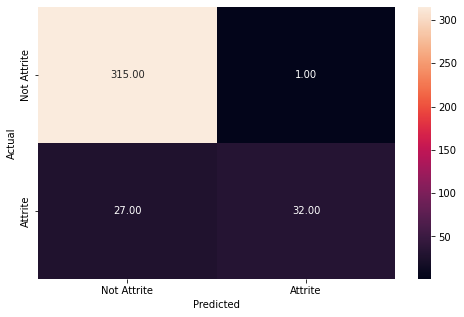

In [69]:
# Checking performance on the test data
y_pred_test_svm = model_rbf.predict(X_cv_scaled)
metrics_score(y_cv, y_pred_test_svm)

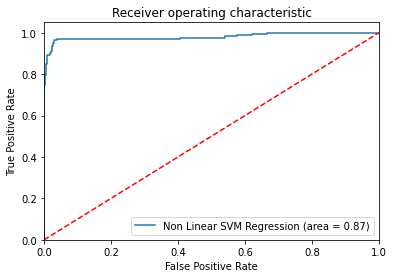

In [70]:
#AUC ROC curve
svm_nonlinear_roc_auc = roc_auc_score(y_train, model_rbf.predict(X_train_scaled))
fpr, tpr, thresholds = roc_curve(y_train, model_rbf.predict_proba(X_train_scaled)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Non Linear SVM Regression (area = %0.2f)' % svm_nonlinear_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()
#AUC is better than models above of 0.78

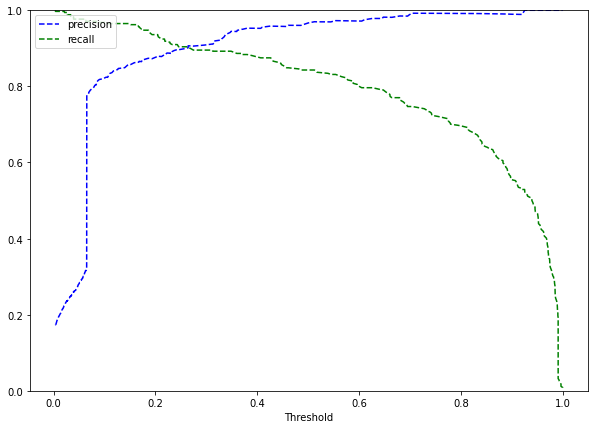

In [71]:
precisions_svm, recalls_svm, thresholds_svm = precision_recall_curve(y_train, model_rbf.predict_proba(X_train_scaled)[:,1])
#Plot values of precisions, recalls, and thresholds
plt.figure(figsize=(10,7))
plt.plot(thresholds_svm, precisions_svm[:-1], 'b--', label='precision')
plt.plot(thresholds_svm, recalls_svm[:-1], 'g--', label = 'recall')
plt.xlabel('Threshold')
plt.legend(loc='upper left')
plt.ylim([0,1])
plt.show()
#A good threshold could be 0.3 to improve model_rbf recall.

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1780
           1       0.91      0.90      0.90       344

    accuracy                           0.97      2124
   macro avg       0.95      0.94      0.94      2124
weighted avg       0.97      0.97      0.97      2124



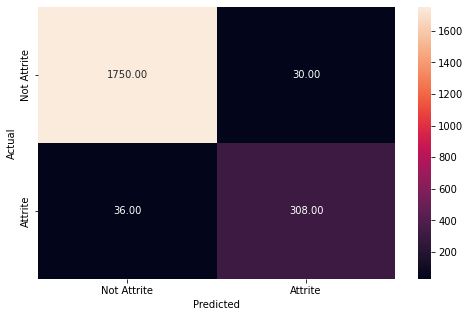

In [75]:
optimal_threshold1=.3
y_pred_train = model_rbf.predict_proba(X_train_scaled)
metrics_score(y_train, y_pred_train[:,1]>optimal_threshold1)
#The recall is much better when the threshold is reduced with minor trade off on precision

              precision    recall  f1-score   support

           0       0.96      0.94      0.95       316
           1       0.73      0.81      0.77        59

    accuracy                           0.92       375
   macro avg       0.85      0.88      0.86       375
weighted avg       0.93      0.92      0.92       375



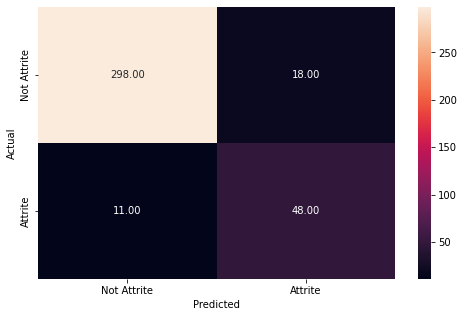

In [76]:
optimal_threshold1=.3
y_pred_test = model_rbf.predict_proba(X_cv_scaled)
metrics_score(y_cv, y_pred_test[:,1]>optimal_threshold1)

### **Building a Decision Tree Model**

* We will build our model using the **DecisionTreeClassifier function.** 
* If the frequency of class A is 17% and the frequency of class B is 83%, then class B will become the dominant class, and **the decision tree will become biased toward the dominant classes.**
* **class_weight is a hyperparameter** for the decision tree classifier, and in this case, we can pass a dictionary {0:0.17,1:0.83} to the model to specify the weight of each class and the decision tree will give more weightage to class 1.

**Let's check the model performance of decision tree**

#### We have scaled the data for logistic and SVM, but for tree based models, we don't have to use the scaled data, also we cannot interpret the decision rule using the scaled data

In [77]:
#building decision tree -> Imbalanced dataset -> More 0s than 1s so need class weight to assign 
#higher penalty to 1s than 0s
dt = DecisionTreeClassifier(class_weight={0:0.17,1:0.83}, random_state=1)

In [79]:
#fitting decision tree
dt.fit(X_train_scaled, y_train)

DecisionTreeClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1780
           1       1.00      1.00      1.00       344

    accuracy                           1.00      2124
   macro avg       1.00      1.00      1.00      2124
weighted avg       1.00      1.00      1.00      2124



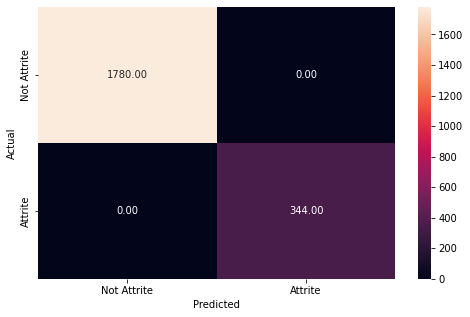

In [80]:
#checking performance on train dataset
y_train_pred_dt=dt.predict(X_train_scaled)
metrics_score(y_train,y_train_pred_dt)


**Observations:**
- The Decision tree is giving a **100% result on the training dataset.**

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       316
           1       0.86      0.83      0.84        59

    accuracy                           0.95       375
   macro avg       0.91      0.90      0.91       375
weighted avg       0.95      0.95      0.95       375



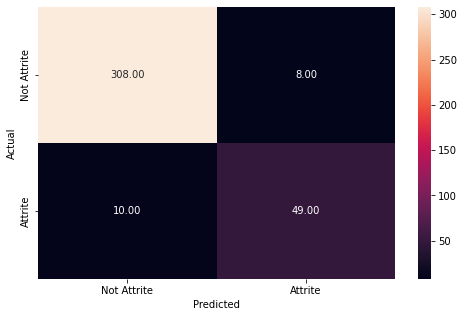

In [81]:
#checking performance on test dataset
y_test_pred_dt=dt.predict(X_cv_scaled)
metrics_score(y_cv,y_test_pred_dt)
#Overfitted model which is the norm with Decision Trees without any pruning

**Observations:**

- The Decision Tree works well on the training data but **not so well on the test data** as the recall is 0.83 as compared to 1 for the training dataset. i.e. the Decision Tree is over-fitting on the data.
- The precision on the test data suggests that there's a 25% (1-0.75) chance that the model will predict that a person is going to leave even though he/she would not, and **the company may waste their time and energy on these employees who are not at risk of attrition.**

<AxesSubplot:xlabel='Importance'>

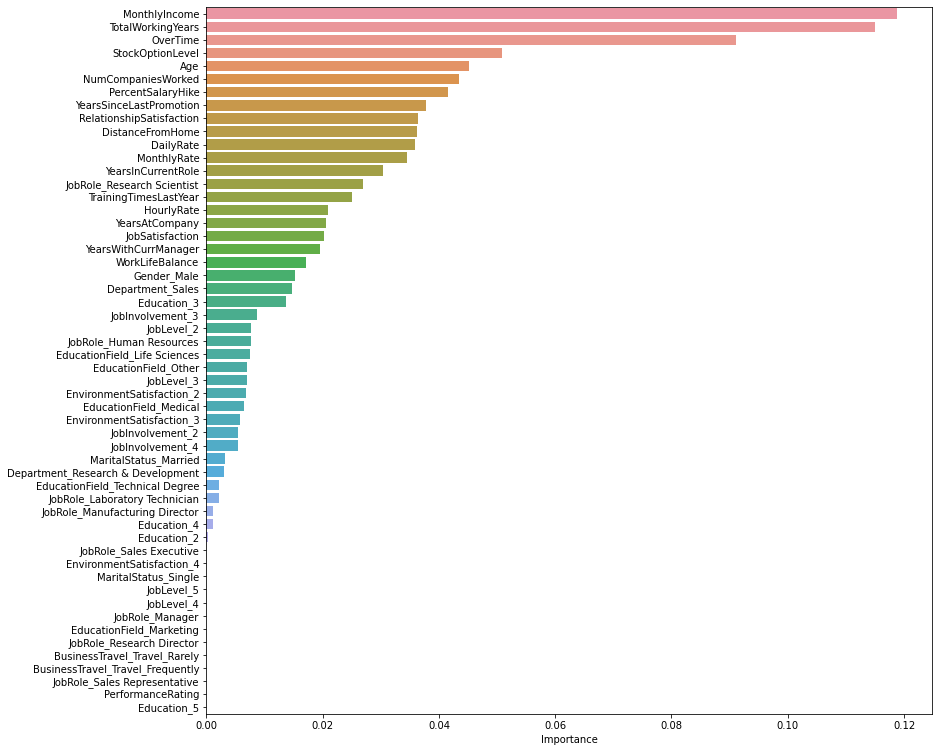

In [82]:
#plot the feature importance
importances = dt.feature_importances_
columns=X_train_scaled.columns
importance_df=pd.DataFrame(importances,index=columns,columns=['Importance']).sort_values(by='Importance',ascending=False)
plt.figure(figsize=(13,13))
sns.barplot(importance_df.Importance,importance_df.index)

**Observations:**
- According to the Decision Tree, **Overtime is the most important feature, followed by Age, total working years and Monthly income.** 
- This might signify that people who are at risk of attrition have low income, are doing overtime and have less experience. 
- The other important features are `DailyRate`, `DistanceFromHome`, `JobInvolvement` and `PercentSalaryHike`.

### **Building the Random Forest Classifier**

**Random Forest is a bagging algorithm where the base models are Decision Trees.** Samples are taken from the training data and on each sample a decision tree makes a prediction. 

**The results from all the decision trees are combined together and the final prediction is made using voting or averaging.**

In [83]:
#Fitting the decision tree classifier on the training data 
rf_estimator = RandomForestClassifier(class_weight={0:0.17,1:0.83}, random_state=1)

rf_estimator.fit(X_train_scaled,y_train)

RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1780
           1       1.00      1.00      1.00       344

    accuracy                           1.00      2124
   macro avg       1.00      1.00      1.00      2124
weighted avg       1.00      1.00      1.00      2124



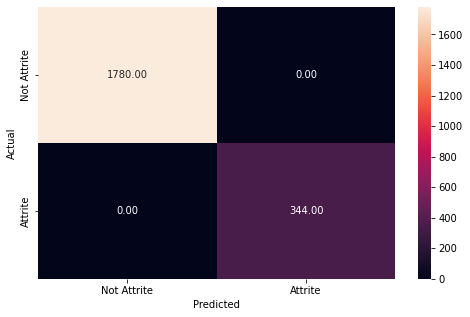

In [84]:
#Checking performance on the training data
y_pred_train_rf = rf_estimator.predict(X_train_scaled)
metrics_score(y_train, y_pred_train_rf)

              precision    recall  f1-score   support

           0       0.95      1.00      0.98       316
           1       1.00      0.75      0.85        59

    accuracy                           0.96       375
   macro avg       0.98      0.87      0.92       375
weighted avg       0.96      0.96      0.96       375



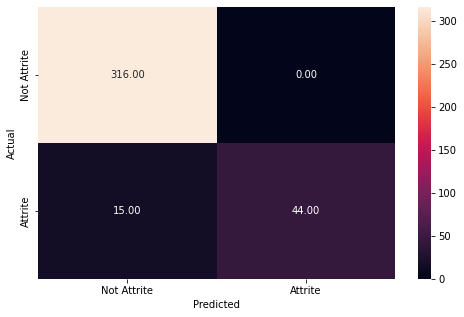

In [85]:
#Checking performance on the testing data
y_pred_test_rf = rf_estimator.predict(X_cv_scaled)
metrics_score(y_cv, y_pred_test_rf)
#Model does overfit the data. We can tune the parameters to reduce overfit with hyperparameter tuning

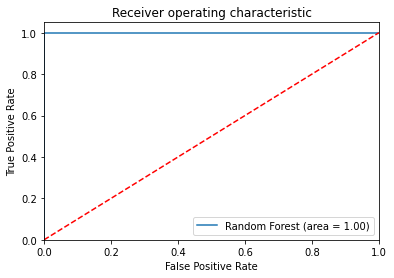

In [86]:
#AUC ROC curve
rf_roc_auc = roc_auc_score(y_train, rf_estimator.predict(X_train_scaled))
fpr, tpr, thresholds = roc_curve(y_train, rf_estimator.predict_proba(X_train_scaled)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Random Forest (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()
#AUC is perfect as 1 - Shows overfitted data that needs to be tuned 
#We will use the Random Forest model for deployment further by HyperParameter tuning and 
#building an ML pipeline to run the model directly on raw data coming from Production data feed

**Observations:**
- The Random Forest classifier **seems to be overfitting on the data**, since the training recall is 1 and the testing recall is only ~0.80.
- Precision on the test data using the Random Forest is doing very well. 

**Let's try to tune the model and check if we could improve the results.**

### **Using GridSearch for Hyperparameter Tuning on the model**

* Hyperparameter tuning is also tricky in the sense that **there is no direct way to calculate how a change in the hyperparameter value will reduce the loss of your model**, so we usually resort to experimentation. We'll use Grid search to perform hyperparameter tuning.
* **Grid search is a tuning technique that attempts to compute the optimum values of hyperparameters.** 
* **It is an exhaustive search** that is performed on the specific parameter values of a model.
* The parameters of the estimator/model used to apply these methods are **optimized by cross-validated grid-search** over a parameter grid.

**Criterion{“gini”, “entropy”}**

The function to measure the quality of a split. Supported criteria are “gini” for the Gini impurity and “entropy” for the information gain.

**max_depth** 

The maximum depth of the tree. If None, then nodes are expanded until all leaves are pure or until all leaves contain less than min_samples_split samples.

**min_samples_leaf**

The minimum number of samples is required to be at a leaf node. A split point at any depth will only be considered if it leaves at least min_samples_leaf training samples in each of the left and right branches. This may have the effect of smoothing the model, especially in regression.


### **Tuning the Random Forest**

**n_estimators**: The number of trees in the forest.

**min_samples_split**: The minimum number of samples required to split an internal node:

**min_samples_leaf**: The minimum number of samples required to be at a leaf node. 

**max_features{“auto”, “sqrt”, “log2”, 'None'}**: The number of features to consider when looking for the best split.

- If “auto”, then max_features=sqrt(n_features).

- If “sqrt”, then max_features=sqrt(n_features) (same as “auto”).

- If “log2”, then max_features=log2(n_features).

- If None, then max_features=n_features.

#### This make take upto 20-30 minutes

In [87]:
# Choose the type of classifier
rf_estimator_tuned = RandomForestClassifier(class_weight={0:0.17,1:0.83}, random_state=1,n_jobs=5)

# Grid of parameters to choose from
## add from article
params_rf = {  
        "n_estimators": [50,75,100,250,500],  #5
        "min_samples_leaf": np.arange(1,4,1),  #4
        "max_features": [0.7,0.9,'auto'],   #3
}
#Tuning the model with 120 combinations

# Type of scoring used to compare parameter combinations - recall score for class 1
scorer = metrics.make_scorer(recall_score, pos_label=1)

# Run the grid search using 5 Fold Cross Validation
grid_obj = GridSearchCV(rf_estimator_tuned, params_rf, scoring=scorer, cv=5)
grid_obj = grid_obj.fit(X_cv_scaled, y_cv)

# Set the classifier to the best combination of parameters
rf_estimator_tuned = grid_obj.best_estimator_

#n_estimators - # of trees
#min_samples_leaf - Min sample at leaf node
#max_features - features to consider for each split

#Better alternate to choose RandomizedSearchCV - faster to get the optimized value

In [88]:
rf_estimator_tuned.fit(X_train_scaled, y_train)

RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, max_features=0.7,
                       min_samples_leaf=3, n_estimators=50, n_jobs=5,
                       random_state=1)

In [89]:
grid_obj.best_estimator_

RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, max_features=0.7,
                       min_samples_leaf=3, n_estimators=50, n_jobs=5,
                       random_state=1)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1780
           1       0.99      0.99      0.99       344

    accuracy                           1.00      2124
   macro avg       0.99      0.99      0.99      2124
weighted avg       1.00      1.00      1.00      2124



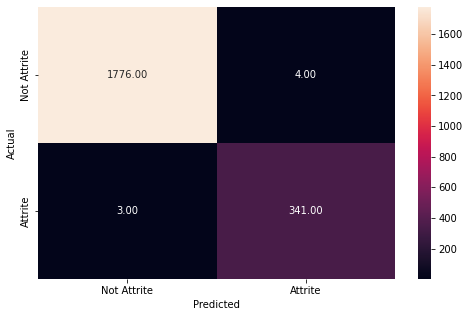

In [90]:
#Checking performance on the training data
y_pred_train_rf_tuned = rf_estimator_tuned.predict(X_train_scaled)
metrics_score(y_train, y_pred_train_rf_tuned)

              precision    recall  f1-score   support

           0       0.96      0.99      0.98       370
           1       0.93      0.80      0.86        71

    accuracy                           0.96       441
   macro avg       0.95      0.90      0.92       441
weighted avg       0.96      0.96      0.96       441



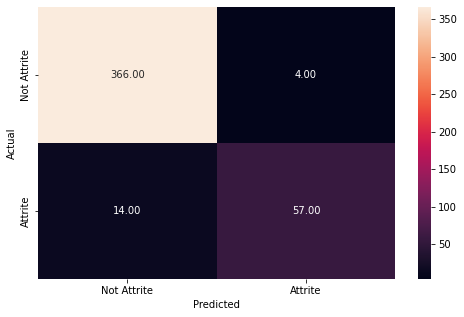

In [91]:
#Checking performance on the test data
y_pred_test_rf_tuned = rf_estimator_tuned.predict(X_test_scaled)
metrics_score(y_test, y_pred_test_rf_tuned)

**Observations:**
- The tuned model is also comparatively overfitting on the training dataset, but **it shows a very good performance on the test dataset.**
- **The recall for the tuned model has improved from 79% to 83%** with a small decrease in precision. 
- **This model is the best-performing one among all the models so far,** and is giving us good precision and recall scores on the test dataset.

<AxesSubplot:xlabel='Importance'>

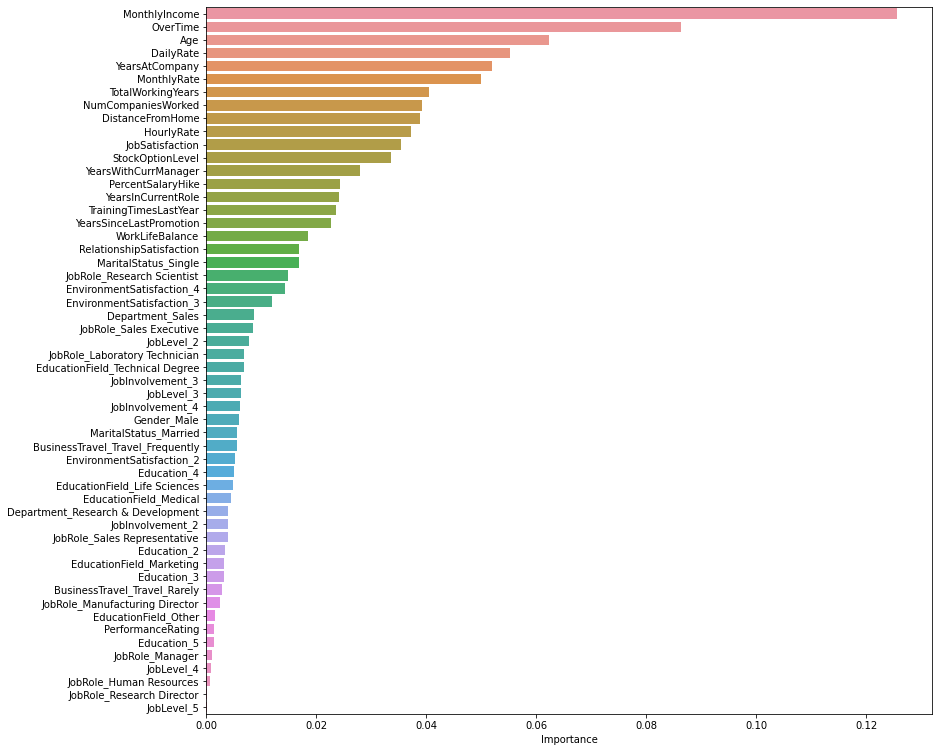

In [92]:
#plotting feature importance
importances = rf_estimator_tuned.feature_importances_
columns=X_train_scaled.columns
importance_df=pd.DataFrame(importances,index=columns,columns=['Importance']).sort_values(by='Importance',ascending=False)
plt.figure(figsize=(13,13))
sns.barplot(importance_df.Importance,importance_df.index)

**Observations:**
- **The feature importance plot for the base model and tuned model are quite similar** - the model seems to suggest that OverTime, MonthlyIncome, Age,TotalWorkingYears and DailyRate are the most important features.
- Other important features are DistanceFromHome, StockOptionLevel, YearsAt Company and NumCompaniesWorked.

### Conclusion and Recommendations 

**Conclusions:**

- We have tried multiple models and were **able to identify the key factors involved with high attrition** in the organization.
- The final model - **SVM classifier with non-linear kernel at a threshold value of 0.35**, is overfitting a bit on the training dataset but **gives the highest recall on the training and the testing data.** It may be possible to further try and tune the model, and the HR department can use this model to predict whether an employee is at risk of attrition or not.
- The best model we have got so far is the tuned random forest model and SVM threshold value of 0.35, which are giving  same result i.e. ~85% recall on the test data .
- The company should use this model to know beforehand which employee is going to attrite and act accordingly. 
- Overtime, MonthlyIncome, DailyRate, number of companies worked and work experience/age seem to be the most important features.

**Recommendations:**

- We saw that **working overtime is the most important driver of attrition.** The organization should manage their work more efficiently so that employees don't have to work overtime and can manage to have a work-life balance, or failing this, the company could provide some additional incentives to employees who are working overtime in order to retain them.
- The organization should focus on the employees who are working in **sales and marketing** as **the attrition rate is quite high for these departments.** Perhaps the organization could look into their incentive schemes and try to come up with better ideas to retain these employees. 
- As observed earlier, **the organization has a lower percentage salary hike and promotions are given less frequently.** The company might be able to focus on giving promotions more frequently or that could increase the annual appraisal hike to incentivize employees to stay.
- **A higher monthly income might lower the odds of an employee attriting.** The company should make sure that all its employees are compensated at least based on industry standards.
- We observed that **approximately 40% of employees have given a poor rating on job satisfaction and environment satisfaction** , possibly contributing to a higher attrition rate. The organization should focus on improving the culture and environment of the organization by coming up with new ideas to make the office environment more open and friendly.
- **Distance from home is also an important factor for attrition** - employees traveling a greater distance to reach the workplace are more likely to attrite. For such employees, the company could provide shuttle facilities so that the commute for such employees gets easier.
- The data and the model suggest that **lower job involvement leads to a higher likelihood of attrition**. This might be due to a lack of growth opportunities or a poor management style. A more pro-active, hands-on approach may be required from the managers in the organization.
- **Young and relatively new/inexperienced employees tend to show a higher attrition rate.** The organization might be able to keep track of the problems that employees with less experience face in a better manner and come up with better ideas on how the management might help them. This may help create a healthier, more welcoming environment for younger employees.
- The organization could come up with a revised CTC plan that includes stock options for a larger proportion of the employees in order to keep them motivated.

### We will build a ML pipeline using the chosen Random Forest model and transformations 

In [94]:
# Deploy Model on end point 
# Assume we selected the random forest model to be deployed
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler,LabelEncoder, OneHotEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, GridSearchCV
from category_encoders import OrdinalEncoder
from sklearn.base import BaseEstimator, TransformerMixin

class CategoricalFeatureEngineerTransformer( BaseEstimator, TransformerMixin ):
    #Class constructor method that takes in a list of values as its argument
    def __init__(self):
        print("In Initialization Function")
        
    #Return self nothing else to do here
    def fit( self, X, y = None  ):
        return self
    
    #Transformer method we wrote for this transformer 
    def transform(self, X , y = None ):
       #mapping attrition
       dict_OverTime = {'Yes': 1, 'No':0} 
       X['OverTime'] = X.OverTime.map(dict_OverTime)
    
       #returns numpy array
       return X 

# Need to define a init, fit and transformer function
#The feature engineering custom class created inherits from Base Estimator and Transformer Mixin class 

In [95]:
#Column transformer used to define column transformations for each of our features
mapped_features = ['OverTime']

other_cat_cols =  ['BusinessTravel', 'Department','Education', 'EducationField','EnvironmentSatisfaction', 
                   'Gender','JobInvolvement','JobLevel', 'JobRole', 'MaritalStatus']

#Creating numerical columns
numeric_features=['DailyRate','Age','DistanceFromHome','MonthlyIncome','MonthlyRate','PercentSalaryHike','TotalWorkingYears',
          'YearsAtCompany','NumCompaniesWorked','HourlyRate','YearsInCurrentRole','YearsSinceLastPromotion',
          'YearsWithCurrManager','TrainingTimesLastYear','JobSatisfaction','WorkLifeBalance',
          'StockOptionLevel', 'PerformanceRating','RelationshipSatisfaction']

#TRANSFORMERS
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

mapped_transformer = Pipeline(steps=[
    ('featureengineer', CategoricalFeatureEngineerTransformer())
    ])

other_cat_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='not_captured')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
        ('feed_col', mapped_transformer, mapped_features),
        ('other_cat_col', other_cat_transformer, other_cat_cols )
    ])
# Name, Object, Columns to be provide for each transformer step for Column Transformer


In Initialization Function


In [96]:
#Adding into Pipeline with Column Tranformers for standard transformation and a Final Estimator Random Forest
clf = Pipeline(steps=[ ('preprocessor', preprocessor),
                      ('classifier', RandomForestClassifier(class_weight={0: 0.17, 1: 0.83}, max_features=0.7,
                       min_samples_leaf=3, n_estimators=50, n_jobs=5,
                       random_state=1))])

In [97]:
#Run the ML pipeline against data we already collected
X=df2.drop(columns=['Attrition'])
Y=df2['Attrition']
dict_attrition = {'Yes': 1, 'No': 0}
Y = Y.map(dict_attrition)

In [98]:
#Fitting Pipeline 
clf.fit(X,Y)

In Initialization Function


Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('imputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('scaler',
                                                                   StandardScaler())]),
                                                  ['DailyRate', 'Age',
                                                   'DistanceFromHome',
                                                   'MonthlyIncome',
                                                   'MonthlyRate',
                                                   'PercentSalaryHike',
                                                   'TotalWorkingYears',
                                                   'YearsAtCompany',
                                                   'NumCompaniesWorked',
   

In [99]:
#Getting accuracy score on entire dataset 
clf.score(X,Y)

1.0

In [100]:
# Save pipeline model as a file that can be used again later on
import pickle
with open('Employee_Attrition.pkl','wb') as f:
    pickle.dump(clf,f)

#### Code to be run in Production Environment

In [101]:
# Reload the pipeline from the saved file.
rf_pickle = pickle.load(open('Employee_Attrition.pkl','rb'))
rf_pickle.score(X,Y)

1.0

In [ ]:
# Save pickle file with Flask code for deploying your ML algorithm at an end point / Kubernetes deployment / AWS deployment

In [102]:
#Make predictions on an individual data point
df2.loc[14]

Attrition                                      Yes
Age                                             28
BusinessTravel                       Travel_Rarely
DailyRate                                      103
Department                  Research & Development
DistanceFromHome                                24
Education                                        3
EducationField                       Life Sciences
EnvironmentSatisfaction                          3
Gender                                        Male
HourlyRate                                      50
JobInvolvement                                   2
JobLevel                                         1
JobRole                      Laboratory Technician
JobSatisfaction                                  3
MaritalStatus                               Single
MonthlyIncome                                 2028
MonthlyRate                                  12947
NumCompaniesWorked                               5
OverTime                       

In [103]:
rf_pickle.predict(pd.DataFrame(df2.loc[14].drop('Attrition')).T)

array([1], dtype=int64)

In [104]:
#Another example prediction
df2.loc[1004]

Attrition                                       No
Age                                             26
BusinessTravel                       Travel_Rarely
DailyRate                                      652
Department                  Research & Development
DistanceFromHome                                 7
Education                                        3
EducationField                               Other
EnvironmentSatisfaction                          3
Gender                                        Male
HourlyRate                                     100
JobInvolvement                                   4
JobLevel                                         1
JobRole                      Laboratory Technician
JobSatisfaction                                  1
MaritalStatus                               Single
MonthlyIncome                                 3578
MonthlyRate                                  23577
NumCompaniesWorked                               0
OverTime                       

In [105]:
rf_pickle.predict(pd.DataFrame(df2.loc[1004].drop('Attrition')).T)

array([0], dtype=int64)

### Explainable AI - Shapley Values

In [110]:
#Function to get feature names from Column Transformer
import sklearn

def get_feature_names(column_transformer):
    """Get feature names from all transformers.
    Returns
    -------
    feature_names : list of strings
        Names of the features produced by transform.
    """
    # Remove the internal helper function
    #check_is_fitted(column_transformer)
    
    # Turn loopkup into function for better handling with pipeline later
    def get_names(trans):
        # >> Original get_feature_names() method
        if trans == 'drop' or (
                hasattr(column, '__len__') and not len(column)):
            return []
        if trans == 'passthrough':
            if hasattr(column_transformer, '_df_columns'):
                if ((not isinstance(column, slice))
                        and all(isinstance(col, str) for col in column)):
                    return column
                else:
                    return column_transformer._df_columns[column]
            else:
                indices = np.arange(column_transformer._n_features)
                return ['x%d' % i for i in indices[column]]
        if not hasattr(trans, 'get_feature_names'):
        # >>> Change: Return input column names if no method avaiable
            # Turn error into a warning
            warnings.warn("Transformer %s (type %s) does not "
                                 "provide get_feature_names. "
                                 "Will return input column names if available"
                                 % (str(name), type(trans).__name__))
            # For transformers without a get_features_names method, use the input
            # names to the column transformer
            if column is None:
                return []
            else:
                return [name + "__" + f for f in column]

        return [name + "__" + f for f in trans.get_feature_names()]
    
    ### Start of processing
    feature_names = []
    
    # Allow transformers to be pipelines. Pipeline steps are named differently, so preprocessing is needed
    if type(column_transformer) == sklearn.pipeline.Pipeline:
        l_transformers = [(name, trans, None, None) for step, name, trans in column_transformer._iter()]
    else:
        # For column transformers, follow the original method
        l_transformers = list(column_transformer._iter(fitted=True))
    
    
    for name, trans, column, _ in l_transformers: 
        if type(trans) == sklearn.pipeline.Pipeline:
            # Recursive call on pipeline
            _names = get_feature_names(trans)
            # if pipeline has no transformer that returns names
            if len(_names)==0:
                _names = [name + "__" + f for f in column]
            feature_names.extend(_names)
        else:
            feature_names.extend(get_names(trans))
    
    return feature_names

In [111]:
# Explain model results for better interpretation for Business Stakeholders

In [112]:
import shap 
#calculate the average marginal contribution of each player (feature) in a coalition game (model prediction) across all permutations 
#so independent of model used and any of its biases & assumption violations

In [113]:
explainer = shap.TreeExplainer(rf_pickle[1])

In [114]:
shap_values = explainer.shap_values(preprocessor.transform(X))

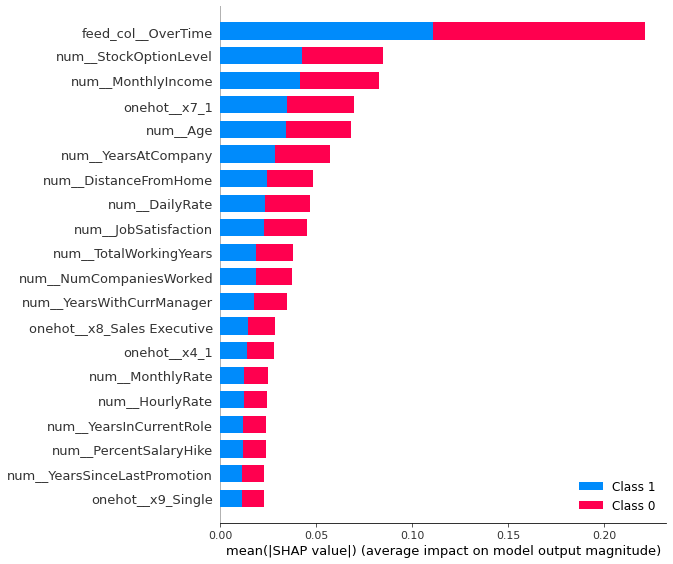

In [115]:
shap.summary_plot(shap_values, pd.DataFrame(preprocessor.transform(X),columns=get_feature_names(preprocessor)), plot_type="bar")
# How much each feature contributes to both 0 and 1 class here - Global Interpretability

In [118]:
X.loc[14]

Age                                             28
BusinessTravel                       Travel_Rarely
DailyRate                                      103
Department                  Research & Development
DistanceFromHome                                24
Education                                        3
EducationField                       Life Sciences
EnvironmentSatisfaction                          3
Gender                                        Male
HourlyRate                                      50
JobInvolvement                                   2
JobLevel                                         1
JobRole                      Laboratory Technician
JobSatisfaction                                  3
MaritalStatus                               Single
MonthlyIncome                                 2028
MonthlyRate                                  12947
NumCompaniesWorked                               5
OverTime                                       Yes
PercentSalaryHike              

In [116]:
# How particular prediction is made 
choosen_instance = pd.DataFrame(pd.DataFrame(preprocessor.transform(X)[14]).T)
choosen_instance.columns = get_feature_names(preprocessor)
choosen_instance
shap_values = explainer.shap_values(choosen_instance)
shap.initjs()
shap.force_plot(explainer.expected_value[1], shap_values[1], choosen_instance)
# Explain each prediction and the reasons behind it - Local Interpretability